In [1]:
# Get CCF aligned metadata

import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import SimpleITK as sitk
import pathlib
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm
from rich import print as rprint

custom_params = {"axes.spines.right": False, "axes.spines.top": False}
sns.set_theme(style="ticks", font_scale=0.8, rc=custom_params)
%config InlineBackend.figure_format="retina"

from abc_atlas_access.abc_atlas_cache.abc_project_cache import AbcProjectCache
from abcex.utils.config import load_config

paths = load_config()
paths["data"]
rprint(paths)

Paths are for dataset tagged: root


{
    'data': PosixPath('/allen/programs/celltypes/workgroups/mousecelltypes/Rohan/dat/raw/abc_atlas'),
    'package_dir': PosixPath('/allen/programs/celltypes/workgroups/mousecelltypes/Rohan/code/abcex'),
    'config_file': PosixPath('/allen/programs/celltypes/workgroups/mousecelltypes/Rohan/code/abcex/config.toml')
}

In [2]:
download_base = paths["data"]
abc_cache = AbcProjectCache.from_s3_cache(download_base)
rprint(abc_cache.current_manifest)

# we were previously using manifest tagged 20240330.
abc_cache.load_manifest('releases/20240831/manifest.json')
rprint(abc_cache.compare_manifests('releases/20240831/manifest.json', 'releases/20240330/manifest.json'))

releases/20240831/manifest.json

{
    'directory_changes': {'new_dirs': ['MERFISH-C57BL6J-638850-imputed'], 'removed_dirs': []},
    'metadata_changes': {
        'new_metadata': ['MERFISH-C57BL6J-638850-imputed: gene'],
        'removed_metadata': [],
        'changed_metadata': [],
        'manifest_error_metadata': []
    },
    'data_file_changes': {
        'new_data_file': ['MERFISH-C57BL6J-638850-imputed: C57BL6J-638850-imputed/log2'],
        'removed_data_file': [],
        'changed_data_file': [],
        'manifest_error_data_file': []
    }
}

In [3]:
meta = abc_cache.get_metadata_dataframe(
    directory="MERFISH-C57BL6J-638850", file_name="cell_metadata_with_cluster_annotation"
)
meta.set_index("cell_label", inplace=True)
display(meta.head(3))

,brain_section_label,cluster_alias,average_correlation_score,feature_matrix_label,donor_label,donor_genotype,donor_sex,x,y,z,neurotransmitter,class,subclass,supertype,cluster,neurotransmitter_color,class_color,subclass_color,supertype_color,cluster_color
cell_label,,,,,,,,,,,,,,,,,,,,
1019171907102340387-1,C57BL6J-638850.37,1408,0.596276,C57BL6J-638850,C57BL6J-638850,wt/wt,M,7.226245,4.148963,6.6,NaN,04 DG-IMN Glut,038 DG-PIR Ex IMN,0141 DG-PIR Ex IMN_2,0515 DG-PIR Ex IMN_2,#666666,#16f2f2,#3D53CC,#CC7A3D,#73FFBF
1104095349101460194-1,C57BL6J-638850.26,4218,0.641180,C57BL6J-638850,C57BL6J-638850,wt/wt,M,5.064889,7.309543,4.2,Glut,23 P Glut,235 PG-TRN-LRN Fat2 Glut,0953 PG-TRN-LRN Fat2 Glut_1,4199 PG-TRN-LRN Fat2 Glut_1,#2B93DF,#6b5ca5,#9B7ACC,#990041,#663D63
1017092617101450577,C57BL6J-638850.25,4218,0.763531,C57BL6J-638850,C57BL6J-638850,wt/wt,M,5.792921,8.189973,4.0,Glut,23 P Glut,235 PG-TRN-LRN Fat2 Glut,0953 PG-TRN-LRN Fat2 Glut_1,4199 PG-TRN-LRN Fat2 Glut_1,#2B93DF,#6b5ca5,#9B7ACC,#990041,#663D63


In [4]:
# Judith's list:
MY_celltypes = [
    "APN C1ql2 Glut",
    "APN C1ql4 Glut",
    "B-PB Nr4a2 Glut",
    "CBN Dmbx1 Gaba",
    "CBN Neurod2 Pvalb Glut",
    "CS-PRNr-DR En1 Sox2 Gaba",
    "CS-PRNr-PCG Tmem163 Otp Gaba",
    "CS-RPO Meis2 Gaba",
    "CU-ECU-SPVI Foxb1 Glut",
    "CUN Evx2 Lhx2 Glut",
    "CUN-PPN Evx2 Meis2 Glut",
    "DMX VII Tbx20 Chol",
    "DTN-LDT-IPN Otp Pax3 Gaba",
    "GRN-IRN-MDRNd Ikzf1 Gly-Gaba",
    "HB Calcb Chol",
    "IC Six3 En2 Gaba",
    "IC Tfap2d Maf Glut",
    "IF-RL-CLI-PAG Foxa1 Glut",
    "IO Fgl2 Glut",
    "IPN Otp Crisp1 Gaba",
    "IPN-LDT Vsx2 Nkx6-1 Glut",
    "IRN Dmbx1 Pax2 Gly-Gaba",
    "IRN Vip Glut",
    "LDT Fgf7 Gaba",
    "LDT Vsx2 Nkx6-1 Nfib Glut",
    "LDT-DTN Gata3 Nfix Gaba",
    "LDT-PCG St18 Gaba",
    "LDT-PCG Vsx2 Lhx4 Glut",
    "LDT-PCG-CS Gata3 Lhx1 Gaba",
    "LGv-SPFp-SPFm Nkx2-2 Tcf7l2 Gaba",
    "MARN-GRN Pyy Glut",
    "MARN-PPY Ngfr Gly-Gaba",
    "MB-MY Tph2 Glut-Sero",
    "MB-ant-ve Dmrta2 Glut",
    "MDRN Hoxb5 Ebf2 Gly-Gaba",
    "MDRNd Bves Glut",
    "MDRNd Prox1 Pax6 Gly-Gaba",
    "MDRNv Crp Glut",
    "MDRNv Lhx4 Qrfprl Glut",
    "MRN Pou3f1 C1ql4 Glut",
    "MRN-PAG Nkx6-1 Glut",
    "MRN-PPN-CUN Pax8 Gaba",
    "MRN-VTN-PPN Pax5 Cdh23 Gaba",
    "MV Nkx6-1 Gly-Gaba",
    "MV Pax6 Gly-Gaba",
    "MV-SPIV Phox2b Ebf3 Lbx1 Glut",
    "MV-SPIV Slc6a2 Glut",
    "MV-SPIV Zic4 Neurod2 Glut",
    "MV-SPIV-PRP Dmbx1 Gly-Gaba",
    "MY Lhx1 Gly-Gaba",
    "MY Prox1 Lmo7 Gly-Gaba",
    "ND-INC Foxd2 Glut",
    "NI-RPO Gata3 Nr4a2 Gaba",
    "NLL Gata3 Gly-Gaba",
    "NLL-SOC Spp1 Glut",
    "NTS Aldh1a2 Glut",
    "NTS Dbh Glut",
    "NTS Mbnl3 Glut",
    "NTS Phox2b Glut",
    "NTS-MDRNd Prox1 Zic1 Gly-Gaba",
    "NTS-PARN Neurod2 Gly-Gaba",
    "PAG Pou4f1 Bnc2 Glut",
    "PAG Pou4f1 Ebf2 Glut",
    "PAG Pou4f2 Glut",
    "PAG Pou4f2 Mesi2 Glut",
    "PAG Pou4f3 Glut",
    "PAG-MRN Pou3f1 Glut",
    "PAG-MRN Rln3 Gaba",
    "PAG-MRN Tfap2b Glut",
    "PAG-MRN-RN Foxa2 Gaba",
    "PAG-ND-PCG Onecut1 Gaba",
    "PAG-PPN Pax5 Sox21 Gaba",
    "PAG-RN Nkx2-2 Otx1 Gaba",
    "PAG-SC Neurod2 Meis2 Glut",
    "PAG-SC Pou4f1 Zic1 Glut",
    "PARN-MDRNd-NTS Gbx2 Gly-Gaba",
    "PAS-MV Ebf2 Gly-Gaba",
    "PB Evx2 Glut",
    "PB Lmx1a Glut",
    "PB Pax5 Glut",
    "PB Sst Gly-Gaba",
    "PB-NTS Phox2b Ebf3 Lmx1b Glut",
    "PB-PSV Phox2b Glut",
    "PB-SUT Tlx3 Lhx2 Glut",
    "PCG-PRNr Vsx2 Nkx6-1 Glut",
    "PDTg Otp Olig3 Gaba",
    "PDTg-PCG Pax6 Gaba",
    "PG-TRN-LRN Fat2 Glut",
    "PGRN-PARN-MDRN Hoxb5 Glut",
    "PGRNd Dmbx1 Glut",
    "POR Gata3 Gly-Gaba",
    "POR Spp1 Gly-Gaba",
    "PPN-CUN-PCG Otp En1 Gaba",
    "PPY-PGRNl Vip Glyc-Gaba",
    "PRC-PAG Pax6 Glut",
    "PRC-PAG Tcf7l2 Irx2 Glut",
    "PRNc Otp Gly-Gaba",
    "PRNc Prox1 Brs3 Gly-Gaba",
    "PRNc-NI-SG-RPO Vsx2 Nr4a2 Glut",
    "PRNc-PARN Tlx1 Glut",
    "PRNr Otp Nfib Glut",
    "PRP Gata3 Slc6a5 Gly-Gaba",
    "PRP Otp Gly-Gaba",
    "PRP-NI-PRNc-GRN Otp Glut",
    "PRT Mecom Gaba",
    "PRT Tcf7l2 Gaba",
    "PSV Lmx1a Trpv6 Glut",
    "PSV Pvalb Lhx2 Glut",
    "Pineal Crx Glut",
    "RO-RPA Pkd2l1 Gaba",
    "RPA Pax6 Hoxb5 Gly-Gaba",
    "SC Bnc2 Glut",
    "SC Lef1 Otx2 Gaba",
    "SC Otx2 Gcnt4 Gaba",
    "SC Tnnt1 Gli3 Gaba",
    "SC-PAG Lef1 Emx2 Gaba",
    "SCdg-PAG Tfap2b Glut",
    "SCig Foxb1 Glut",
    "SCig Tfap2b Chrnb3 Glut",
    "SCig-an-PPT Foxb1 Glut",
    "SCiw Pitx2 Glut",
    "SCm-PAG Cdh23 Gaba",
    "SCop Pou4f2 Neurod2 Glut",
    "SCop Sln Glut",
    "SCs Dmbx1 Gaba",
    "SCs Lef1 Gli3 Gaba",
    "SCs Pax7 Nfia Gaba",
    "SCsg Gabrr2 Gaba",
    "SCsg Pde5a Glut",
    "SNc-VTA-RAmb Foxa1 Dopa",
    "SNr Six3 Gaba",
    "SNr-VTA Pax5 Npas1 Gaba",
    "SPA-SPFm-SPFp-POL-PIL-PoT Sp9 Glut",
    "SPVC Ccdc172 Glut",
    "SPVC Mafa Glut",
    "SPVC Nmu Glut",
    "SPVI-SPVC Sall3 Lhx1 Gly-Gaba",
    "SPVI-SPVC Sall3 Nfib Gly-Gaba",
    "SPVI-SPVC Tlx3 Ebf3 Glut",
    "SPVO Mafa Meis2 Glut",
    "VCO Mafa Meis2 Glut",
]
# print number of subclasses
print(f"Number of medulla (MY) subclasses: {len(MY_celltypes)}")

Number of medulla (MY) subclasses: 141


In [5]:
unique_subclasses = meta["subclass"].unique()
print(f"Number of unique subclasses (overall): {len(unique_subclasses)}")

unique_supertypes = meta["supertype"].unique()
print(f"Number of unique supertypes (overall): {len(unique_supertypes)}")

Number of unique subclasses (overall): 338
Number of unique supertypes (overall): 1201


In [6]:
# Check for partial string match

matched_names = {MY_celltype: None for MY_celltype in MY_celltypes}
not_found = []

for query in tqdm(MY_celltypes):
    for ref in unique_subclasses:
        if query in ref:
            matched_names[query] = ref
            break
    if matched_names[query] is None:
        not_found.append(query)

# create dataframe from dict, and add a column with the number associated with the matched name
matched_names_df = pd.DataFrame.from_dict(matched_names, orient="index", columns=["matched_name"])
matched_names_df["order"] = matched_names_df["matched_name"].str.extract(r"(\d+)").astype(int)
matched_names_df.sort_values("order", inplace=True)
display(matched_names_df.head(3))

100%|██████████| 141/141 [00:00<00:00, 45155.14it/s]


,matched_name,order
PRC-PAG Pax6 Glut,155 PRC-PAG Pax6 Glut,155
MB-ant-ve Dmrta2 Glut,156 MB-ant-ve Dmrta2 Glut,156
MRN-PAG Nkx6-1 Glut,158 MRN-PAG Nkx6-1 Glut,158


In [7]:
# subset cell metadata to only include medulla celltypes using the matched names
MY_meta = meta[meta["subclass"].isin(matched_names_df["matched_name"])].copy()
MY_meta["z"] = np.round(MY_meta["z"], 3) # there are some funky floating point values in z otherwise.

# convert MY_meta["subclass"] into a category with the order of the matched names
MY_meta["subclass"] = pd.Categorical(MY_meta["subclass"], categories=matched_names_df["matched_name"], ordered=True)

Index(['subclass', 'subclass_color', 'count'], dtype='object')

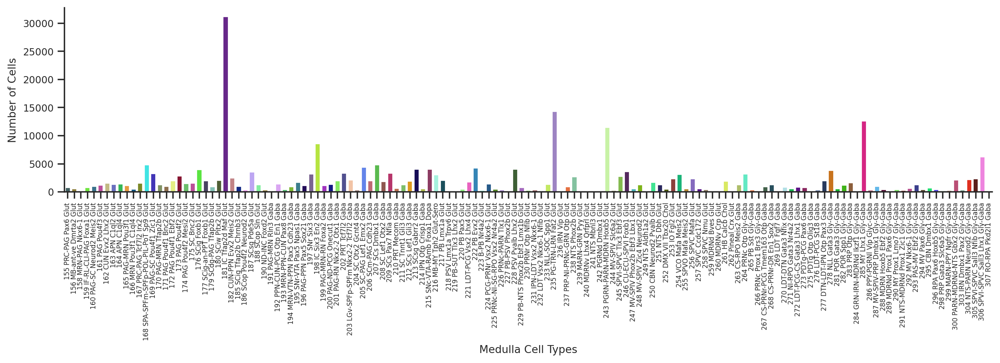

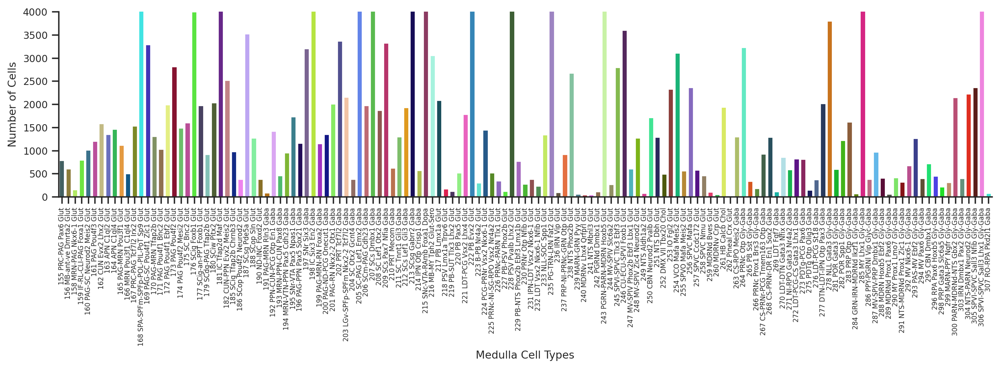

In [8]:
hist_df = MY_meta[["subclass", "subclass_color"]].value_counts().to_frame().reset_index()

# swap values to show bars colored by subclass color
palette_dict = {k: v for k, v in zip(hist_df["subclass"].values, hist_df["subclass_color"].values)}
display(hist_df.columns)

# overall
f, ax = plt.subplots(1, 1, figsize=(15, 3))
sns.barplot(x=hist_df["subclass"], y=hist_df["count"], hue=hist_df["subclass"], palette=palette_dict, ax=ax)
ax.set(xlabel="Medulla Cell Types", ylabel="Number of Cells")
plt.xticks(rotation=90, fontsize=6)
plt.show()

# zoomed in version
f, ax = plt.subplots(1, 1, figsize=(15, 3))
sns.barplot(x=hist_df["subclass"], y=hist_df["count"], hue=hist_df["subclass"], palette=palette_dict, ax=ax)
ax.set(xlabel="Medulla Cell Types", ylabel="Number of Cells", ylim=(0, 4000))
plt.xticks(rotation=90, fontsize=6)
plt.show()

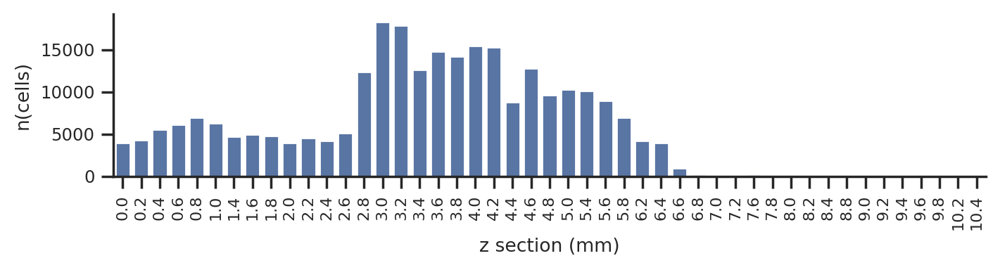

In [9]:
df = MY_meta["z"].value_counts().sort_index().to_frame().sort_values(by="count", ascending=False)
df.sort_values(by="z", ascending=False, inplace=True)

# show barplot
f, ax = plt.subplots(1, 1, figsize=(8, 1.5))
sns.barplot(x=np.round(df.index,2), y=df["count"], ax=ax)
ax.set(xlabel="z section (mm)", ylabel="n(cells)")
plt.xticks(rotation=90, fontsize=8)
plt.show()

In [10]:
df = MY_meta[["subclass", "z"]].copy()

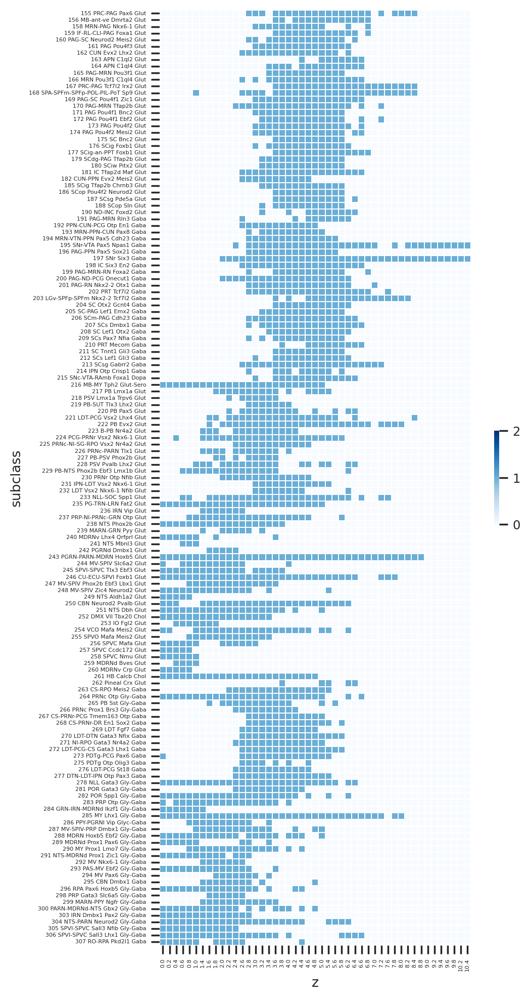

In [11]:
# use crosstab to get the counts of each subclass in each z section
df.drop_duplicates(inplace=True)
df_ = pd.crosstab(df["subclass"], df["z"])

f, ax = plt.subplots(1, 1, figsize=(6, 12))
sns.heatmap(df_, 
            cmap="Blues", 
            vmin=0,
            vmax=2,
            linewidths=0.1,
            square=True,
            annot_kws={"size": 4},
            cbar_kws={"shrink": 0.1},
            xticklabels=1,
            yticklabels=1,
            ax=ax,
            )
plt.xticks(fontsize=4)
plt.yticks(fontsize=4)
plt.show()

In [12]:
# create dataframe with all zeros, with df_.index as columns and index
df_same_z = pd.DataFrame(0.0, index=df_.index, columns=df_.index)

# We want a subclass by subclass matrix for each z section. 
# If cells of subclass A are in the same z section cells of subclass B, the entry (A,B) is 1.
for subclass_A in df_.index:
    for subclass_B in df_.index:
        AB_in_same_z = np.sum(df_.loc[subclass_A].values * df_.loc[subclass_B].values)
        df_same_z.loc[subclass_A, subclass_B] = AB_in_same_z

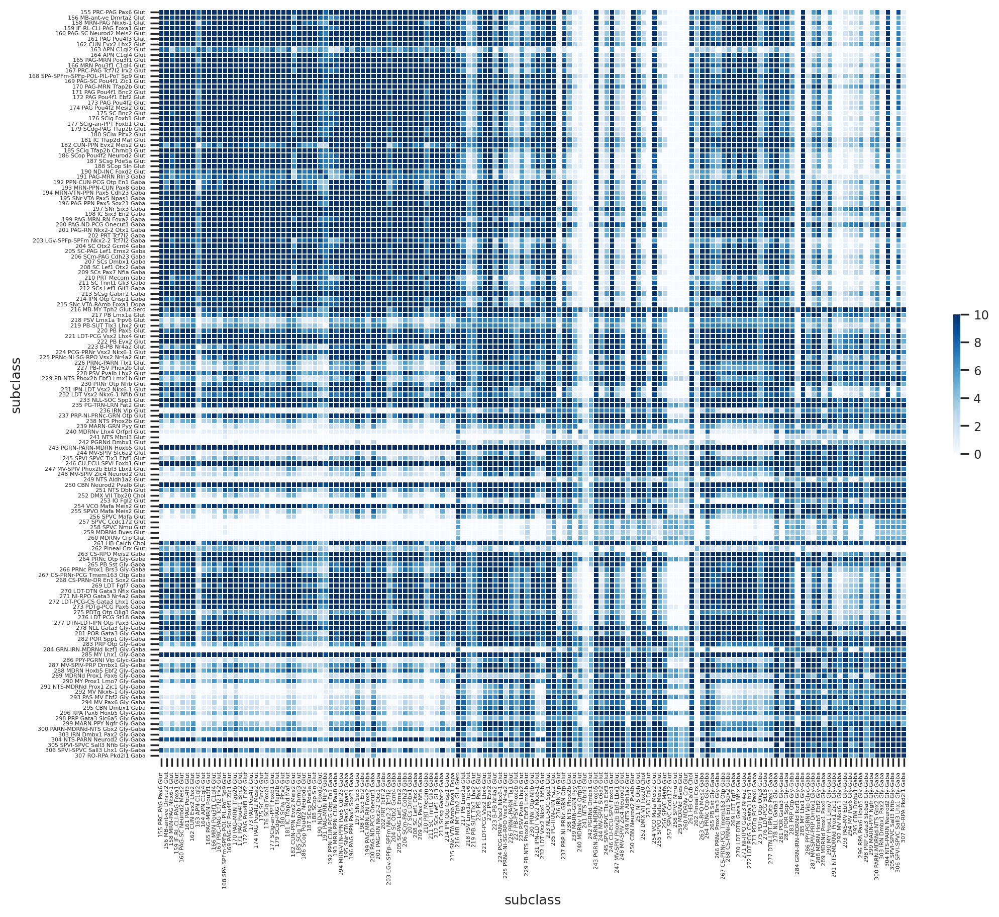

In [13]:
# Shows number of z sections in which any two MY subclasses co-occur. 
f, ax = plt.subplots(1, 1, figsize=(12, 12))
sns.heatmap(df_same_z, 
            cmap="Blues", 
            vmin=0,
            vmax=10,
            linewidths=0.1,
            square=True,
            annot_kws={"size": 4},
            cbar_kws={"shrink": 0.15},
            xticklabels=1,
            yticklabels=1,
            ax=ax,
            )
plt.xticks(fontsize=4)
plt.yticks(fontsize=4)
plt.show()

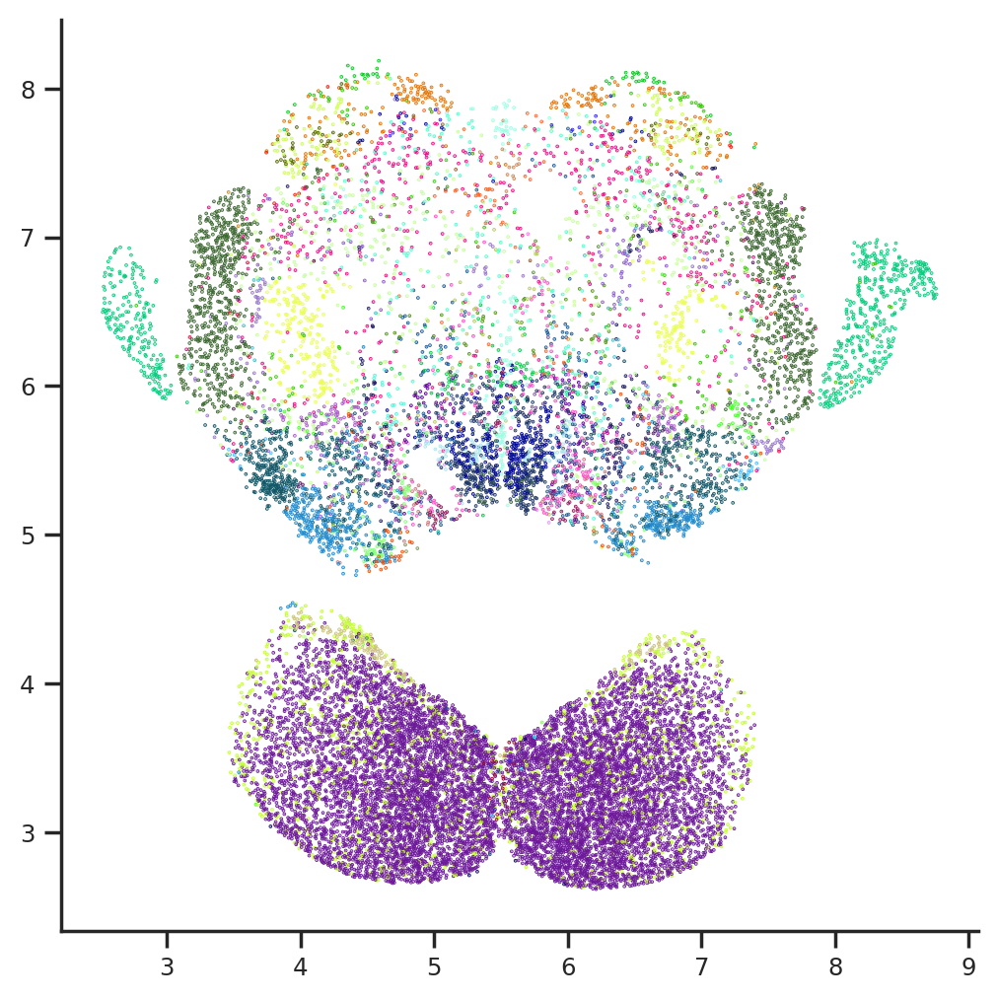

In [14]:
MY_meta_section = MY_meta[MY_meta["z"] == 3.0].copy()
MY_meta_section["z"] = np.round(MY_meta_section["z"], 3)

f, ax = plt.subplots(1, 1, figsize=(6, 6))
ax.scatter(MY_meta_section["x"], MY_meta_section["y"], s=.1, c=MY_meta_section["subclass_color"])
plt.show()

In [15]:
# interactive plot to see labels
import plotly.express as px
fig = px.scatter(MY_meta_section, x="x", y="y", color="subclass", width=600, height=600, color_discrete_map=palette_dict)
fig.update_traces(marker=dict(size=5))
fig.update_xaxes(scaleanchor="y", scaleratio=1)
fig.update_layout(showlegend=False)
fig.show()

In [16]:
import numpy as np
from sklearn.neighbors import KDTree

d_thr = 0.10 # this is in mm
n_neighbors = 15 # number of neighbors within d_thr to get
X = MY_meta_section[['x', 'y']].values # only need to calculate this once
tree = KDTree(X, leaf_size=2) # building the tree is the time consuming step; the queries would be fast. Tune parameters if queries are slow. 

In [17]:
# init
df_closeby_labels = df_same_z.copy()
df_closeby_labels.loc[:,:] = 0

In [20]:
for source_subclass in tqdm(df_closeby_labels.index.values):
    source_indices = np.flatnonzero(MY_meta_section["subclass"] == source_subclass)
    labels_closeby = []
    for i in source_indices:
        d, ind = tree.query(X[[i]], k=n_neighbors)
        d, ind = d[0], ind[0]
        labels_closeby_ = MY_meta_section["subclass"].iloc[ind[d < d_thr]].values.tolist()
        labels_closeby += labels_closeby_

    temp_df = pd.DataFrame(labels_closeby, columns=["subclass"])
    temp_df["subclass"] = pd.Categorical(temp_df["subclass"], categories=matched_names_df["matched_name"], ordered=True)
    temp_df = temp_df.value_counts().to_frame().reset_index()
    df_closeby_labels.loc[source_subclass, temp_df["subclass"]] = temp_df["count"].values

100%|██████████| 141/141 [00:05<00:00, 23.62it/s]


In [22]:
# row normalize df_closeby_labels
df_closeby_labels = df_closeby_labels.div(df_closeby_labels.sum(axis=1)+1e-7, axis=0)

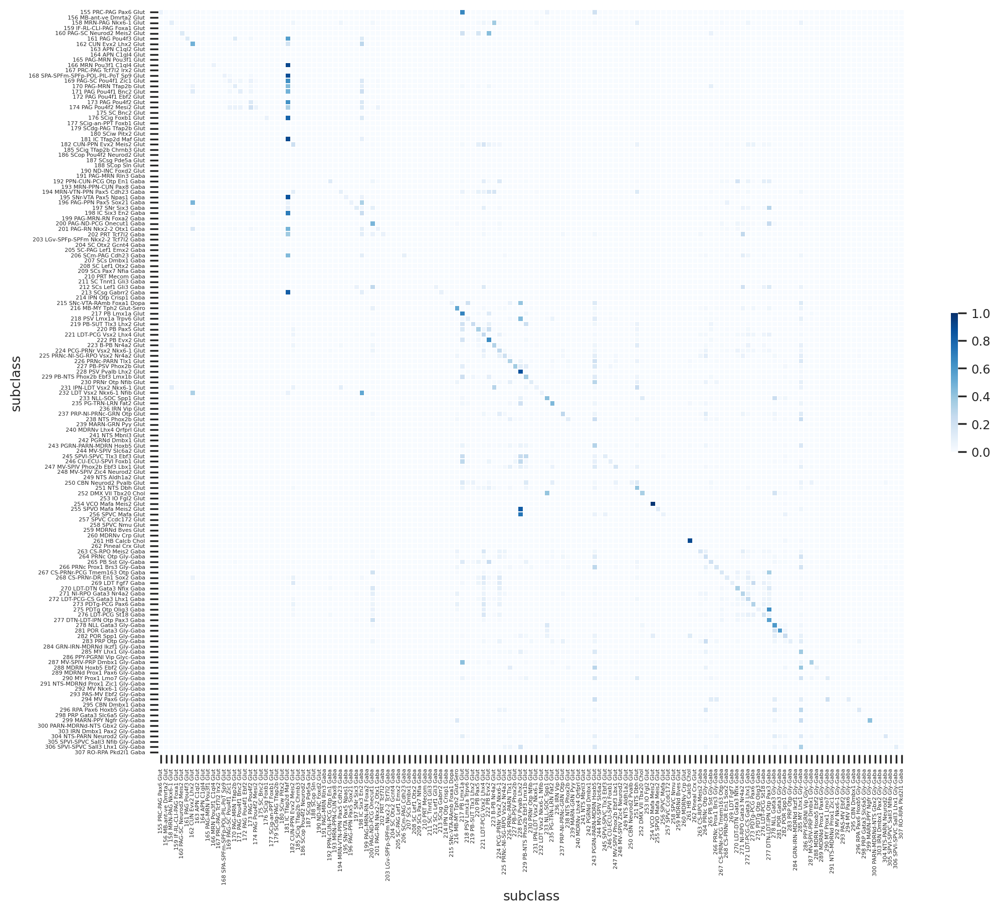

In [23]:
# Shows number of z sections in which any two MY subclasses co-occur. 
f, ax = plt.subplots(1, 1, figsize=(12, 12))
sns.heatmap(df_closeby_labels, 
            cmap="Blues", 
            vmin=0,
            vmax=1,
            linewidths=0.1,
            square=True,
            annot_kws={"size": 4},
            cbar_kws={"shrink": 0.15},
            xticklabels=1,
            yticklabels=1,
            ax=ax,
            )
plt.xticks(fontsize=4)
plt.yticks(fontsize=4)
plt.show()

In [28]:
# interactive plot to see labels

df_plot = MY_meta_section.copy()
df_plot["indicator"] = (MY_meta_section["subclass"] == "278 NLL Gata3 Gly-Gaba").astype(str)

color_dict = {0: "#999999", 1: "#FF0000"}
import plotly.express as px
fig = px.scatter(df_plot, x="x", y="y", color="indicator", width=600, height=600, color_discrete_map=color_dict)
fig.update_traces(marker=dict(size=5))
fig.update_xaxes(scaleanchor="y", scaleratio=1)
fig.update_layout(showlegend=False)
fig.show()